#The moving sofa problem

All sofas in this Colab are obtained through exploratory experiments. Due to the discrete step sizes it is possible that occasionally the sofas clip into the wall slightly. We attempted to rectify this occasionally by adding a buffer to the walls of the corridor, but none of the final intersection values should be taken as rigorous lower bounds. For discussion and rigorous lower bounds on the sizes of the constructions, we refer to the Colab for the 3D sofa problem:

https://google-deepmind.github.io/alphaevolve_repository_of_problems/problems/64.html

## A corridor with a single turn

**Prompt used**

Act as an expert software developer and optimization specialist specializing in
creating python lists with certain properties. Your task is to find a python list consisting of lists of size three with
the highest possible score, where the score function is given below:



```
def calculate_intersection_area(corridor, curr_path):
    """
    Calculates the area of the intersection of the corridor at different rotations/translations.

    Args:
        corridor: A Corridor object defining the corridor geometry.
        curr_path: A list of (x, y) tuples representing the inner corner path.
        total_turn_angle: The total angle in degrees for the corridor's rotation.

    Returns:
        The area of the intersection polygon.
    """
    curr_path = smooth_path(curr_path)
    intersection = None
    num_steps = len(curr_path)
    new_path = [[0, 0, 0]] + curr_path + [[-2, 0, 90]]

    for i in range(num_steps + 1):
      alpha_degrees = new_path[i][2]
      path_point = new_path[i][0:2]
      current_corridor = corridor.get_corridor_shape(alpha_degrees, path_point)

      if intersection is None:
        intersection = current_corridor
      else:
        intersection = intersection.intersection(current_corridor)

      if intersection.is_empty:
        return 0.0, intersection

    return intersection.area, intersection
```

As you can see, the list you are looking for will correspond to a path through a
corridor. The first two numbers in every element will be coordinates, the last
one will be an angle. So an element of the form [0.1,-0.2,45] will mean
something like "move to position (0.1,-0.2) and face 45 degrees to the right
from North".
You have to find the highest scoring path from [0, 0, 0] to [-2, 0, 90], but the
corridor is going to be a mystery for now sadly.

You may code up any search method you want, and you are allowed to call the
calculate_intersection_area() function as many times as you want. You have
access to it, you don't need to code up the calculate_intersection_area()
function. You want the score it gives you to be as high as possible!

Your task is to write a search function that searches for the best path. Your
function will have 1000 seconds to run, and after that it has to have returned
the best construction it found. If after 1000 seconds it has not returned
anything, it will be terminated with negative infinity points. You can use your
time best if you have an outer loop of the form
"while time.time() - start_time < 1000:"
or similar, just don't forget to define the "start_time" variable early
in your program. You may choose n, the length of the path, to be anything in
this experiment. Larger values of n have more potential for bigger scores, but
the search space is larger so they are harder to find. You'll have to balance it
accordingly!

You will also receive a small bonus if your path doesn't go back and forth too
much. Focus on creating a smooth path, without unnecessary motions, and maybe
before you return your final object check if you can remove any points from it.

In [ ]:
pip install shapely

In [ ]:
#@title Initial program used

# EVOLVE-BLOCK-START
"""Finds the biggest sofa that fits through a 2D corridor"""
import itertools
import logging
import time
from scipy import integrate
import numpy as np
from scipy import optimize
import warnings
import re
from typing import Any, Callable, Mapping, List, Tuple
import scipy.linalg as la
import numpy.polynomial.polynomial as poly
import collections
import matplotlib.pyplot as plt
import copy
from shapely import geometry
from shapely import ops

Point = geometry.Point
transform = ops.transform
Polygon = geometry.Polygon
minimize = optimize.minimize

# EVOLVE-BLOCK-END


class Corridor:

  def __init__(self):
    """Initializes the corridor.

    Args:
        turns: A list of tuples, where each tuple represents a turn:
          (distance_before_turn, turn_angle_degrees) The first segment starts at
          (0, 0) and extends along the x-axis.
    """
    self.width = 1

  def get_corridor_shape(self, angle_degrees, inner_corner_path):
    """Calculates the polygon representing the corridor at a given angle and inner corner position.

    Args:
        angle_degrees: The current rotation angle of the corridor.
        inner_corner_path: A point (x, y) representing the inner corner.

    Returns:
        A shapely Polygon object representing the corridor.
    """
    angle_radians = np.deg2rad(angle_degrees)
    x_inner, y_inner = inner_corner_path

    big_const = 3

    points = [
        (0, 0),
        (0, -big_const * self.width),
        (self.width, -big_const * self.width),
        (self.width, self.width),
        (-big_const * self.width, self.width),
        (-big_const * self.width, 0),
    ]
    corridor_polygon = Polygon(points)

    # Rotate the corridor
    rotated_polygon = transform(
        lambda x, y: (
            x * np.cos(angle_radians) - y * np.sin(angle_radians),
            x * np.sin(angle_radians) + y * np.cos(angle_radians),
        ),
        corridor_polygon,
    )

    # Translate the corridor so its inner corner is at inner_corner_path
    translated_polygon = transform(
        lambda x, y: (x + x_inner, y + y_inner), rotated_polygon
    )

    return translated_polygon


# EVOLVE-BLOCK-START

# PREVIOUS CONSTRUCTIONS START HERE


# PREVIOUS CONSTRUCTIONS END HERE


def search_for_best_path(corridor_system: Corridor) -> np.ndarray:

  best_path = [
      [-0.1, 0.1, 15],
      [-0.2, 0.2, 20],
      [-0.3, 0.3, 34],
      [-0.3, 0.3, 40],
      [-0.4, 0.3, 50],
      [-0.5, 0.2, 55],
      [-0.6, 0.2, 75],
      [-0.7, 0.3, 86],
  ]

  curr_path = copy.deepcopy(best_path)

  best_score, _ = calculate_intersection_area(corridor_system, best_path)

  start_time = time.time()
  eval_count = 0

  while time.time() - start_time < 50:  # Search for 1000 seconds
    # Greedy search: adjust a random point on the path and keep the change
    # if it improves the score

    # Randomly select a point on the path to adjust
    random_index = np.random.randint(0, len(curr_path))
    curr_path[random_index][0] += np.random.uniform(-0.05, 0.05)
    curr_path[random_index][1] += np.random.uniform(-0.05, 0.05)
    score, _ = calculate_intersection_area(corridor_system, curr_path)
    eval_count += 1
    if score > best_score:
      best_score = score
      best_path = copy.deepcopy(curr_path)
      print(f'Improved Intersection Area: {score:.4f}, best path: {best_path}')

    if np.random.rand() < 0.05:
      curr_path = copy.deepcopy(best_path)
  print(f'Final Intersection Area: {best_score:.4f}')
  print(f'Evaluations: {eval_count}')
  score, _ = calculate_intersection_area(corridor_system, best_path)
  print(f'Final Intersection Area: {score:.4f}, best path: {best_path}')
  return best_path


# EVOLVE-BLOCK-END



In [ ]:
#@title Evaluation code


def calculate_intersection_area(corridor, curr_path):
  """Calculates the area of the intersection of the corridor at different rotations/translations.

  Args:
      corridor: A Corridor object defining the corridor geometry.
      curr_path: A list of (x, y) tuples representing the inner corner path.
      total_turn_angle: The total angle in degrees for the corridor's rotation.

  Returns:
      The area of the intersection polygon.
  """
  curr_path = smooth_path(curr_path)
  intersection = None
  num_steps = len(curr_path)
  new_path = [(0, 0, 0)] + curr_path + [(-2, 0, 90)]

  for i in range(num_steps + 1):
    alpha_degrees = new_path[i][2]
    path_point = new_path[i][0:2]
    current_corridor = corridor.get_corridor_shape(alpha_degrees, path_point)

    if intersection is None:
      intersection = current_corridor
    else:
      intersection = intersection.intersection(current_corridor)

    if intersection.is_empty:
      return 0.0, intersection

  return intersection.area, intersection


def smooth_path(input_path):
  """Smoothens a path by inserting points so that the third element

  differs by at most one between consecutive points.

  Args:
    path: A list of lists, where each inner list has three numbers.

  Returns:
    A new list of lists representing the smoothened path.
  """
  path = [[0, 0, 0]] + input_path + [[-2, 0, 90]]
  smoothed_path = []
  if not path:
    return smoothed_path

  smoothed_path.append(path[0])

  for i in range(len(path) - 1):
    start_point = np.array(path[i])
    end_point = np.array(path[i + 1])

    start_z = int(start_point[2])
    end_z = int(end_point[2])

    if start_z == end_z:
      continue  # No need to insert points

    step = 1 if end_z > start_z else -1
    num_intermediate_points = abs(end_z - start_z) - 1

    if num_intermediate_points > 0:
      # Create the linearly spaced z values for the intermediate points
      intermediate_zs = np.arange(start_z + step, end_z, step)

      # Calculate the weights for the weighted average of x and y
      weights = np.linspace(0, 1, num_intermediate_points + 2)[
          1:-1
      ]  # Exclude 0 and 1

      for z_val, weight in zip(intermediate_zs, weights):
        intermediate_xy = (
            start_point[:2] * (1 - weight) + end_point[:2] * weight
        )
        smoothed_path.append(list(intermediate_xy) + [z_val])

    smoothed_path.append(path[i + 1])

  return smoothed_path


def evaluate(
    hypers: Mapping[str, Any],
) -> tuple[dict[str, float], dict[str, str]]:
  """Returns the ratio for the Sum-Difference Conjecture using joint distribution."""
  result = {}
  feedback = {}
  del hypers  # Unused.

  corridor_system = Corridor()
  best_path = search_for_best_path(corridor_system)
  score, _ = calculate_intersection_area(corridor_system, best_path)
  result['score'] = score
  feedback['best_path'] = best_path
  feedback['best_score_found'] = score
  return result, feedback

In [ ]:
#@title Visualization code

import matplotlib.animation as animation


def plot_polygon_manual(polygon, ax, color='blue', alpha=0.5, label=None):
    """Manually plots a shapely Polygon using matplotlib."""
    if not polygon.is_empty:
        x, y = polygon.exterior.xy
        ax.fill(x, y, color=color, alpha=alpha, label=label)
        ax.plot(x, y, color='black', linewidth=1) # Plot the boundary

def plot_intersection(intersection_polygon, corridor_system=None, curr_path=None):
    """
    Plots the final intersection polygon using the manual plotting function.
    """
    fig, ax = plt.subplots()
    num_steps = len(curr_path)
    new_path = [(0, 0, 0)] + curr_path + [(-2, 0, 90)]

    if not intersection_polygon.is_empty:
        plot_polygon_manual(intersection_polygon, ax=ax, color='green', alpha=1.0)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_title("Largest Area Fitting Through the Corridor")
    ax.set_aspect('equal', adjustable='box')
    ax.legend()
    plt.grid(True)
    plt.show()

    """
    fig, ax = plt.subplots()

    if not intersection_polygon.is_empty:
        plot_polygon_manual(intersection_polygon, ax=ax, color='green', alpha=1.0)

        # Plot corridor positions (using the manual function)
        if corridor_system and curr_path:
            for i in range(0,num_steps,2):
                alpha_degrees = new_path[i][2]
                path_point = new_path[i][0:2]
                current_corridor = corridor_system.get_corridor_shape(alpha_degrees, path_point)
                if not current_corridor.is_empty:
                    plot_polygon_manual(current_corridor, ax=ax, color='gray', alpha=0.05)

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_title("Largest Area Fitting Through the Corridor")
    ax.set_aspect('equal', adjustable='box')
    ax.legend()
    plt.grid(True)
    plt.show()
    """

def animate_intersection(intersection_polygon, corridor_system=None, curr_path=None):
    if not curr_path:
        print("Error: curr_path is empty.")
        return

    num_steps = len(curr_path)
    new_path = [(0, 0, 0)] + curr_path + [(-2, 0, 90)]

    fig, ax = plt.subplots()
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_title("Couch Moving Through the Corridor")
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True)
    ax.set_xlim([-2.5, 2.5]) # Default limits if no path or polygon
    ax.set_ylim([-2.5, 2.5])

    polygon_artist, = ax.fill([], [], color='green', alpha=1.0)
    corridor_artists = []
    for _ in range(2):
        artist, = ax.fill([], [], color='gray', alpha=0.25)
        corridor_artists.append(artist)

    def update(frame):
        current_path_index = min(frame, num_steps + 1) # +1 because new_path has len(curr_path) + 2

        if not intersection_polygon.is_empty:
            x, y = intersection_polygon.exterior.xy
            polygon_artist.set_xy(np.column_stack([x, y]))
        else:
            polygon_artist.set_xy(np.empty((0, 2)))

        # Update the corridor position for the current frame
        for artist in corridor_artists:
            artist.set_xy(np.empty((0, 2))) # Clear previous corridor

        if corridor_system and curr_path and current_path_index < len(new_path):
            alpha_degrees = new_path[current_path_index][2]
            path_point = new_path[current_path_index][0:2]
            current_corridor = corridor_system.get_corridor_shape(alpha_degrees, path_point)

            # print(f"Frame: {frame}, Step: {current_path_index + 1}, Angle: {alpha_degrees}, Point: {path_point}, Corridor Empty: {current_corridor.is_empty}")

            if not current_corridor.is_empty:
                x_corr, y_corr = current_corridor.exterior.xy
                corridor_artists[0].set_xy(np.column_stack([x_corr, y_corr])) # Use the first corridor artist

        ax.set_title(f"Couch Moving Through the Corridor - Step {frame + 1}/{len(range(0, num_steps, 1))}")

        return [polygon_artist] + corridor_artists

    ani = animation.FuncAnimation(fig, update, frames=num_steps + 2, interval=70, blit=True) # Adjust frames

    plt.show()
    return ani


In [ ]:
#@title Search code found by AlphaEvolve


# PREVIOUS CONSTRUCTIONS START HERE


best_path_dfyo = [[-0.042929401386488396, 0.21756376045811743, 9.063023296386266], [-0.17499125113842479, 0.4584715588120939, 21.088159322906687], [-0.3647057803287663, 0.6067527489772335, 32.11494668160108], [-0.5674370403598238, 0.6684859542158242, 42.119001284044174], [-0.7555146446603603, 0.6565519730934757, 51.00000000000103], [-0.952373512998069, np.float64(0.573556768027092), 61.00000000000128], [-1.1518618243129382, 0.3665856095364419, 74.00000000000158], [-1.262883137755585, 0.025838052673341938, 89.00000000000861]]
best_score_found_dfyo = 2.2192697103788173


# PREVIOUS CONSTRUCTIONS END HERE


def search_for_best_path(corridor_system: Corridor) -> np.ndarray:

  best_path = copy.deepcopy(best_path_dfyo) # Start search from previous best construction
  best_score = best_score_found_dfyo

  start_time = time.time()
  eval_count = 0

  initial_path = np.array(best_path)
  num_points = len(initial_path)

  # Define bounds and importance weights for the path parameters
  bounds = []
  importance_weights = []
  for i in range(num_points):
    for j in range(3):
      bounds.append((initial_path[i][j] - 0.1, initial_path[i][j] + 0.1))
      # Prioritize y coordinate and angle
      if j == 1 or j == 2:
        importance_weights.append(1.0)  # Normal weight
      else:
        importance_weights.append(0.1)  # Lower weight for x coordinate

  def objective_function(path_flat):
    """Objective function to minimize (negative intersection area), penalized by distance from initial path."""
    path = np.array(path_flat).reshape(-1, 3).tolist()
    area, _ = calculate_intersection_area(corridor_system, path)

    # Calculate a penalty based on the distance from the initial path, weighted by importance_weights
    penalty = 0.0
    for i in range(len(path_flat)):
      penalty += importance_weights[i] * (path_flat[i] - initial_path.flatten()[i])**2

    return -(area - 0.1 * penalty) # Subtract penalty from negative area so we penalize deviations

  # Optimization
  method = 'L-BFGS-B'  # or 'SLSQP', or 'TNC'
  initial_path_flat = initial_path.flatten()

  result = minimize(objective_function, initial_path_flat, method=method, bounds=bounds,
                    options={'maxfun': 10000, 'maxiter': 10000, 'ftol': 1e-7, 'gtol': 1e-7, 'maxls': 20})

  best_path = np.array(result.x).reshape(-1, 3).tolist()
  best_score = -result.fun
  eval_count = result.nfev

  print(f'Final Intersection Area: {best_score:.4f}')
  print(f'Evaluations: {eval_count}')

  # Perturb only y and angle (index 1 and 2 for each element)
  num_perturbations = 10
  perturbation_range = np.linspace(-1e-5, 1e-5, num_perturbations)
  best_perturbed_path = best_path
  best_perturbed_score = best_score

  for i in range(len(best_path)):
    for j in [1, 2]:  # Only perturb y and angle
      original_value = best_path[i][j]
      for perturbation in perturbation_range:
        perturbed_value = original_value + perturbation
        temp_path = copy.deepcopy(best_path)
        temp_path[i][j] = perturbed_value
        area, _ = calculate_intersection_area(corridor_system, temp_path)
        eval_count += 1

        if area > best_perturbed_score:
          best_perturbed_score = area
          best_perturbed_path = temp_path

  score, _ = calculate_intersection_area(corridor_system, best_perturbed_path)
  print(f'Final Intersection Area: {score:.4f}, best path: {best_perturbed_path}')
  print(f'Evaluations (including perturbation): {eval_count}')

  return best_perturbed_path


2.2192697096945855


/tmp/ipython-input-45-3394452444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


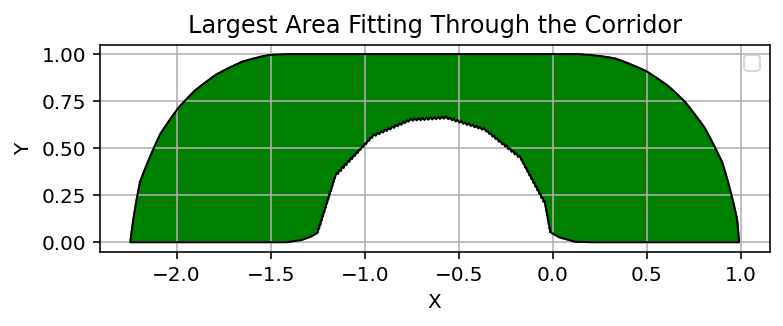

In [ ]:
#@title Visualizing AlphaEvolve's approximation of Gerver's sofa

my_path = [[-0.042929401386488396, 0.21756376045811743, 9.063012770070477],
        [-0.17499125113842479, 0.4584715588120939, 21.088159322906687],
        [-0.3647057803287663, 0.6067527489772335, 32.11494668160108],
        [-0.5674370403598238, 0.6684776208824909, 42.1189235062664],
        [-0.7555146446603603, 0.6565419730934756, 51.00000000000103],
        [-0.952373512998069, 0.5735484346937586, 61.00000000000128],
        [-1.1518618243129382, 0.3665856095364419, 74.00000000000158],
        [-1.262883137755585, 0.025838052673341938, 89.00000000000861]]
score, int_poly = calculate_intersection_area(Corridor(), my_path)
print(score)
plot_intersection(int_poly, Corridor(), smooth_path(my_path))

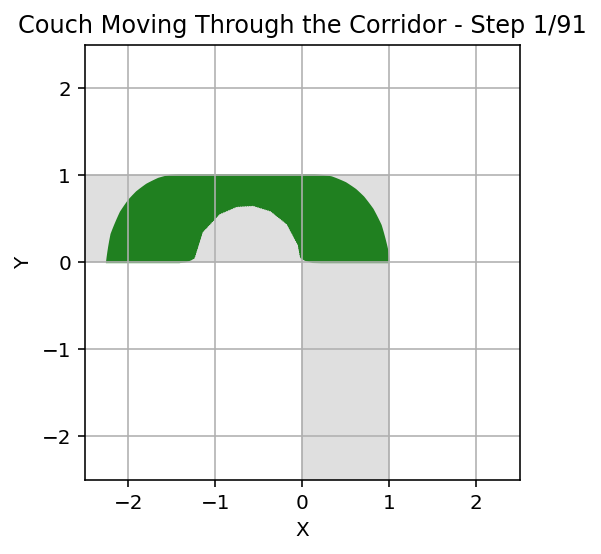

In [ ]:
#@title Animating the sofa's movement

from IPython.display import HTML
animation_object = animate_intersection(int_poly, Corridor(), smooth_path(my_path))
try:
    display(HTML(animation_object.to_jshtml()))
    plt.close() # Close the static plot if running in Jupyter
except ImportError:
    # If not in Jupyter, just show the animation window
    plt.show()

## Ambidextrous sofa

In [ ]:
#@title Initial program and evaluation code

# EVOLVE-BLOCK-START
"""Finds the biggest sofa that fits through a 2D corridor"""
import itertools
import logging
import time
from scipy import integrate
import numpy as np
from scipy import optimize
import warnings
import re
from typing import Any, Callable, Mapping, List, Tuple
import scipy.linalg as la
import numpy.polynomial.polynomial as poly
import collections
import matplotlib.pyplot as plt
import copy
from shapely import geometry
from shapely import ops
from IPython.display import HTML



Point = geometry.Point
transform = ops.transform
Polygon = geometry.Polygon
minimize = optimize.minimize

# EVOLVE-BLOCK-END


class Corridor:

  def __init__(self):
    """Initializes the corridor.

    Args:
        turns: A list of tuples, where each tuple represents a turn:
          (distance_before_turn, turn_angle_degrees) The first segment starts at
          (0, 0) and extends along the x-axis.
    """
    self.width = 1

  def get_corridor_shape(self, angle_degrees, inner_corner_path):
    """Calculates the polygon representing the corridor at a given angle and inner corner position.

    Args:
        angle_degrees: The current rotation angle of the corridor.
        inner_corner_path: A point (x, y) representing the inner corner.

    Returns:
        A shapely Polygon object representing the corridor.
    """
    angle_radians = np.deg2rad(angle_degrees)
    x_inner, y_inner = inner_corner_path

    big_const = 3

    points = [
        (0, 0),
        (0, -big_const * self.width),
        (self.width, -big_const * self.width),
        (self.width, 0),
        ((big_const + 1) * self.width, 0.0),
        ((big_const + 1) * self.width, self.width),
        (-big_const * self.width, self.width),
        (-big_const * self.width, 0),
    ]

    corridor_polygon = Polygon(points)

    # Rotate the corridor
    rotated_polygon = transform(
        lambda x, y: (
            x * np.cos(angle_radians) - y * np.sin(angle_radians),
            x * np.sin(angle_radians) + y * np.cos(angle_radians),
        ),
        corridor_polygon,
    )

    # Translate the corridor so its inner corner is at inner_corner_path
    translated_polygon = transform(
        lambda x, y: (x + x_inner, y + y_inner), rotated_polygon
    )

    return translated_polygon


# EVOLVE-BLOCK-START

# PREVIOUS CONSTRUCTIONS START HERE

best_path_iqhd = [
    [0.0, 0.0, 0.0],
    [-1.0, 0.0, 90.0],
    [1.0, 1.0, 180.0],
    [1.0, 1.0, 180.0],
    [1.0, 1.0, 180.0],
    [-3.0, 1.0, 180.0],
]


best_score_found_ighd = 0.4

# PREVIOUS CONSTRUCTIONS END HERE


def search_for_best_path(corridor_system: Corridor) -> np.ndarray:
  """Searches for the best path that maximizes the intersection area.

  Args:
      corridor_system: A Corridor object defining the corridor geometry.

  Returns:
      A NumPy array representing the best path found.
  """

  # Initialize with the previous best construction
  # Don't forget to change this line to the new name of this variable every time!
  best_path = best_path_iqhd.copy()

  curr_path = copy.deepcopy(best_path)

  best_score, _ = calculate_intersection_area(corridor_system, best_path)
  print(f'Initial Intersection Area: {best_score:.4f}')
  start_time = time.time()
  eval_count = 0

  while time.time() - start_time < 30:  # Search for 1000 seconds
    # Greedy search: adjust a random point on the path and keep the change
    # if it improves the score

    # Randomly select a point on the path to adjust
    random_index = np.random.randint(0, len(curr_path))
    curr_path[random_index][0] += np.random.uniform(-0.05, 0.05)
    curr_path[random_index][1] += np.random.uniform(-0.05, 0.05)
    score, _ = calculate_intersection_area(corridor_system, curr_path)
    eval_count += 1
    if score > best_score:
      best_score = score
      best_path = copy.deepcopy(curr_path)
      print(f'Improved Intersection Area: {score:.4f}, best path: {best_path}')

    if np.random.rand() < 0.05:
      curr_path = copy.deepcopy(best_path)
  print(f'Final Intersection Area: {best_score:.4f}')
  print(f'Evaluations: {eval_count}')
  score, _ = calculate_intersection_area(corridor_system, best_path)
  print(f'Final Intersection Area: {score:.4f}, best path: {best_path}')
  return best_path


# EVOLVE-BLOCK-END


def calculate_intersection_area(corridor, curr_path):
  """Calculates the area of the intersection of the corridor at different rotations/translations.

  Args:
      corridor: A Corridor object defining the corridor geometry.
      curr_path: A list of (x, y) tuples representing the inner corner path.
      total_turn_angle: The total angle in degrees for the corridor's rotation.

  Returns:
      The area of the intersection polygon.
  """
  if len(curr_path) < 6:
    return -1000, None
  # print(f'curr path: {curr_path[:10]}')

  curr_path = smooth_path(curr_path)
  intersection = None
  num_steps = len(curr_path)
  # print(f'num_steps: {num_steps}')
  # print(f'curr path: {curr_path[:10]}')

  for i in range(num_steps):
    alpha_degrees = curr_path[i][2]
    path_point = curr_path[i][0:2]
    current_corridor = corridor.get_corridor_shape(
        alpha_degrees, path_point
    ).buffer(-0.003)
    # To get a rigorous lower bound, this buffer has to be larger than an
    # appropriate function of the smoothing procedure's tolerances

    if intersection is None:
      intersection = current_corridor
    else:
      intersection = intersection.intersection(current_corridor)

    if intersection.is_empty:
      return -(num_steps - i) / num_steps, intersection

    # if i > len(curr_path) // 2 and curr_path[i][0] > -1.5:
    #  return -(num_steps - i) / num_steps, intersection

    # print(curr_path[:i+1])
    # print(i)
    # plot_intersection(intersection, corridor, curr_path[:i+1])

  # Second loop: Verify if the final intersection fits through the corridor
  if intersection is not None and not intersection.is_empty:
    for i in range(num_steps):
      alpha_degrees = curr_path[i][2]
      path_point = curr_path[i][0:2]
      current_corridor_shape = corridor.get_corridor_shape(
          alpha_degrees, path_point
      )
      if not intersection.within(current_corridor_shape):
        print(
            'WARNING: Final intersection polygon does NOT fit through the'
            ' corridor at all transformations.'
        )
        return (
            -(num_steps + 1),
            intersection,
        )  # Return a special negative value to indicate failure

    print(
        'SUCCESS: Final intersection polygon fits through the corridor at all'
        ' transformations.'
    )

  print(f'intersection area: {intersection.area}')
  return intersection.area, intersection


def smooth_path(path, x_tol=0.1, y_tol=0.1, z_tol=1):
  """Smoothens a 3D path by inserting points between segments that exceed

  specified tolerances in any of the x, y, or z coordinates.

  Args:
      path (list of lists or numpy array): A list of 3D points representing the
        path. Each inner list/array should have the format [x, y, z].
      x_tol (float): The maximum allowed difference in the x-coordinate between
        adjacent points.
      y_tol (float): The maximum allowed difference in the y-coordinate between
        adjacent points.
      z_tol (float): The maximum allowed difference in the z-coordinate between
        adjacent points.

  Returns:
      list of lists: A new list of 3D points representing the smoothed path.
  """
  if isinstance(path, list):
    path_np = np.array(path)
  else:  # Assume it's a NumPy array
    path_np = path.copy()
  path = path_np.tolist()  # Convert the NumPy array to a Python list
  path.insert(0, [0, 0, 0])
  path.append([-3.0, 1.0, 180.0])
  # print(f'path (first 10): {path[:10]}')
  # print(f'path: {path[:10]}')

  smoothed_path = [list(path[0])]  # Start with the first point

  for i in range(len(path) - 1):
    p1 = np.array(path[i])
    p2 = np.array(path[i + 1])

    dx = abs(p2[0] - p1[0])
    dy = abs(p2[1] - p1[1])
    dz = abs(p2[2] - p1[2])

    needs_interpolation = dx > x_tol or dy > y_tol or dz > z_tol

    if needs_interpolation:
      # Determine how many intermediate points are needed
      num_x = max(1, int(dx / x_tol) + (1 if dx % x_tol != 0 else 0) - 1)
      num_y = max(1, int(dy / y_tol) + (1 if dy % y_tol != 0 else 0) - 1)
      num_z = max(1, int(dz / z_tol) + (1 if dz % z_tol != 0 else 0) - 1)

      num_interp = max(
          num_x, num_y, num_z
      )  # Take the maximum to satisfy all tolerances

      for j in range(1, num_interp + 1):
        fraction = j / (num_interp + 1)
        interpolated_point = p1 + fraction * (p2 - p1)
        smoothed_path.append(interpolated_point.tolist())

    smoothed_path.append(list(p2))  # Add the next original point

  return np.array(smoothed_path)



SUCCESS: Final intersection polygon fits through the corridor at all transformations.
intersection area: 1.622557452779667


/tmp/ipython-input-45-3394452444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


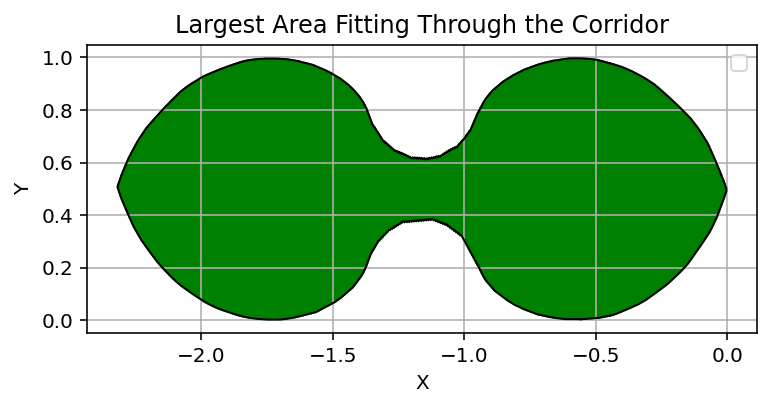

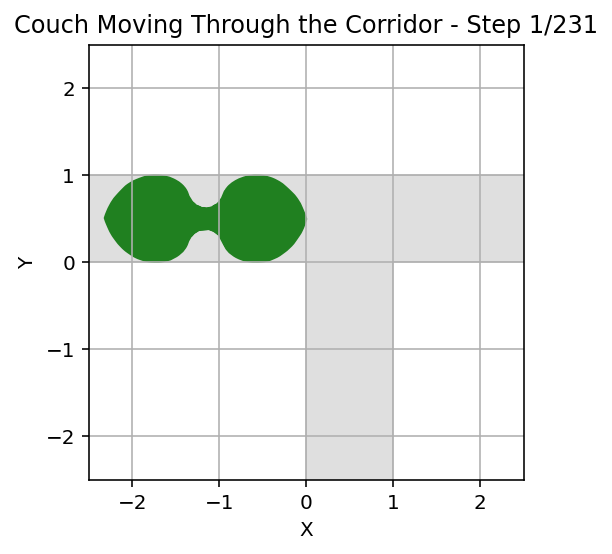

In [ ]:
#@title T-junction visualization

my_path = np.array([[-9.62388328e-01, 2.86831447e-03, 2.45847838e-01], [-9.38629433e-01, 1.86590842e-01, 1.42143789e+01], [-1.01243772e+00,3.21674555e-01, 2.80412513e+01], [-1.06865336e+00,3.62769426e-01, 3.50049892e+01], [-1.12156190e+00,3.82833492e-01, 4.08676092e+01], [-1.23242098e+00,3.73065384e-01, 5.28552064e+01], [-1.28459114e+00,3.41496683e-01, 5.90718537e+01], [-1.32390212e+00,3.00751870e-01, 6.46024010e+01], [-1.35101374e+00,2.55100779e-01, 6.95140412e+01], [-1.38432323e+00,1.67623173e-01, 7.74350799e+01], [-1.33792913e+00,-8.28413088e-03, 9.06049466e+01], [-1.23524537e+00,-1.06007092e-01, 9.84722673e+01], [-1.14221071e+00,-1.50363657e-01, 1.03285022e+02], [-1.08252128e+00,-1.71867358e-01, 1.06264494e+02], [-1.00204919e+00,-1.92987826e-01, 1.10155280e+02], [-8.50573524e-01, -2.06600204e-01, 1.17097261e+02], [-7.23629551e-01, -1.94528275e-01, 1.22692980e+02], [-5.57650743e-01, -1.46635744e-01, 1.30006306e+02], [-4.27631978e-01, -8.02953650e-02, 1.35939317e+02], [-3.67546723e-01, -3.86744197e-02, 1.38842593e+02], [-3.06661615e-01, 7.18353118e-03, 1.41805004e+02], [-1.70937546e-01, 1.49132295e-01, 1.49247727e+02], [-1.12462966e-01, 2.36857977e-01, 1.53112649e+02], [-5.95816328e-02, 3.31684272e-01, 1.57014488e+02], [ 3.07995338e-02, 5.63119858e-01, 1.65631501e+02], [ 7.68871121e-02, 7.04049340e-01, 1.70528341e+02], [ 1.07039420e-01, 8.52322182e-01, 1.75394061e+02], [ 2.04095584e-01, 9.38233105e-01, 1.78199887e+02], [ 2.87245909e-01, 9.69377697e-01, 1.79159961e+02], [ 3.57227257e-01, 9.99746374e-01, 1.79995134e+02], [-2.91923185e+00,1.00019319e+00,1.79993498e+02]])
score, int_poly = calculate_intersection_area(Corridor(), my_path)
plot_intersection(int_poly, Corridor(), list(smooth_path(my_path)))
animation_object = animate_intersection(int_poly, Corridor(), list(smooth_path(my_path)))
try:
    display(HTML(animation_object.to_jshtml()))
    plt.close() # Close the static plot if running in Jupyter
except ImportError:
    # If not in Jupyter, just show the animation window
    plt.show()

SUCCESS: Final intersection polygon fits through the corridor at all transformations.
intersection area: 1.59952313270343


/tmp/ipython-input-45-3394452444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


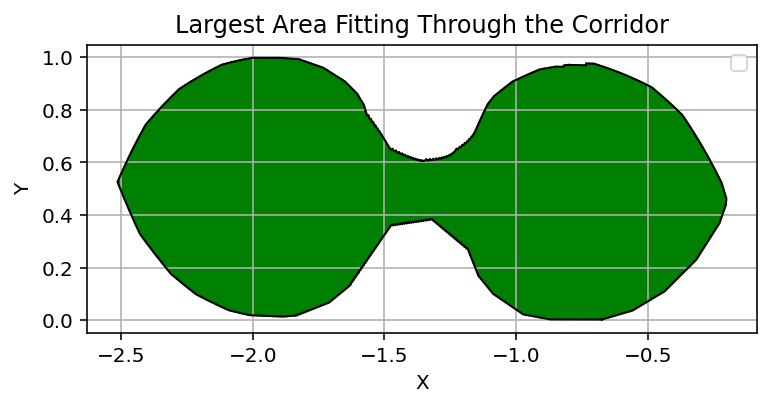

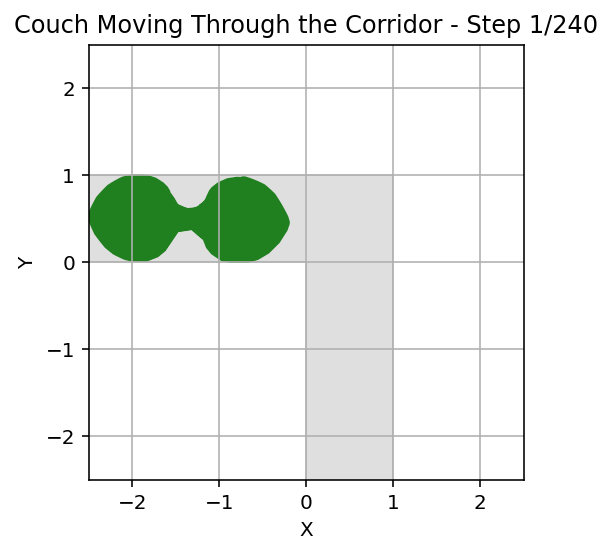

In [ ]:
#@title Corridor with two turns visualization

class Corridor:

  def __init__(self):
    """Initializes the corridor.

    Args:
        turns: A list of tuples, where each tuple represents a turn:
          (distance_before_turn, turn_angle_degrees) The first segment starts at
          (0, 0) and extends along the x-axis.
    """
    self.width = 1

  def get_corridor_shape(self, angle_degrees, inner_corner_path):
    """Calculates the polygon representing the corridor at a given angle and inner corner position.

    Args:
        angle_degrees: The current rotation angle of the corridor.
        inner_corner_path: A point (x, y) representing the inner corner.

    Returns:
        A shapely Polygon object representing the corridor.
    """
    angle_radians = np.deg2rad(angle_degrees)
    x_inner, y_inner = inner_corner_path

    big_const = 3

    points = [
        (0, 0),
        (0, -(big_const + 1) * self.width),
        ((big_const + 5) * self.width, -(big_const + 1) * self.width),
        ((big_const + 5) * self.width, -big_const * self.width),
        (self.width, -big_const * self.width),
        (self.width, self.width),
        (-big_const * self.width, self.width),
        (-big_const * self.width, 0),
    ]

    corridor_polygon = Polygon(points)

    # Rotate the corridor
    rotated_polygon = transform(
        lambda x, y: (
            x * np.cos(angle_radians) - y * np.sin(angle_radians),
            x * np.sin(angle_radians) + y * np.cos(angle_radians),
        ),
        corridor_polygon,
    )

    # Translate the corridor so its inner corner is at inner_corner_path
    translated_polygon = transform(
        lambda x, y: (x + x_inner, y + y_inner), rotated_polygon
    )

    return translated_polygon

def smooth_path(path, x_tol=0.1, y_tol=0.1, z_tol=1):
  """Smoothens a 3D path by inserting points between segments that exceed

  specified tolerances in any of the x, y, or z coordinates.

  Args:
      path (list of lists or numpy array): A list of 3D points representing the
        path. Each inner list/array should have the format [x, y, z].
      x_tol (float): The maximum allowed difference in the x-coordinate between
        adjacent points.
      y_tol (float): The maximum allowed difference in the y-coordinate between
        adjacent points.
      z_tol (float): The maximum allowed difference in the z-coordinate between
        adjacent points.

  Returns:
      list of lists: A new list of 3D points representing the smoothed path.
  """
  if isinstance(path, list):
    path_np = np.array(path)
  else:  # Assume it's a NumPy array
    path_np = path.copy()
  path = path_np.tolist()  # Convert the NumPy array to a Python list
  path.insert(0, [0, 0, 0])
  path.append([-4, 4, 0])
  # print(f'path (first 10): {path[:10]}')
  # print(f'path: {path[:10]}')

  path[len(path) // 2] = [-2, 0, 90]

  smoothed_path = [list(path[0])]  # Start with the first point

  for i in range(len(path) - 1):
    p1 = np.array(path[i])
    p2 = np.array(path[i + 1])

    dx = abs(p2[0] - p1[0])
    dy = abs(p2[1] - p1[1])
    dz = abs(p2[2] - p1[2])

    needs_interpolation = dx > x_tol or dy > y_tol or dz > z_tol

    if needs_interpolation:
      # Determine how many intermediate points are needed
      num_x = max(1, int(dx / x_tol) + (1 if dx % x_tol != 0 else 0) - 1)
      num_y = max(1, int(dy / y_tol) + (1 if dy % y_tol != 0 else 0) - 1)
      num_z = max(1, int(dz / z_tol) + (1 if dz % z_tol != 0 else 0) - 1)

      num_interp = max(
          num_x, num_y, num_z
      )  # Take the maximum to satisfy all tolerances

      for j in range(1, num_interp + 1):
        fraction = j / (num_interp + 1)
        interpolated_point = p1 + fraction * (p2 - p1)
        smoothed_path.append(interpolated_point.tolist())

    smoothed_path.append(list(p2))  # Add the next original point

  return np.array(smoothed_path)

my_path = np.array([[np.float64(-0.19367834401392603), -0.03173471411950362, -1.0706335919416994], [np.float64(-0.4036898676794673), -0.011488060403346708, -0.8284795097563874], [-0.4875125223688205, -0.02786767523384218, -1.3707782268782003], [-0.8410445433406254, -0.018854349661590084, -1.6439481776629719], [-1.1978172905954696, -0.006418555870342131, -0.7371111890736732], [-1.1785054406491875, 0.00887117209888738, 0.13649399246575683], [-1.122632963973988, 0.07172630109708218, 4.531621085504851], [-1.1863598265430377, 0.2710302161509991, 21.520622815589146], [-1.3213677397749652, 0.38220149025644656, 39.29901511316097], [-1.472063102489755, 0.3601045432014221, 55.655600404758516], [-1.6238980616041325, 0.1426782387529305, 79.30513507709097], [-1.571914355318653, 0.047959147941286924, 85.30146162024259], [-1.3144439344677419, 0.2624240960312663, 73.93005785003848], [-1.8046794249225573, 0.021003539176556573, 88.32925549583543], [-1.748739445713505, 0.009720875679720676, 89.01244992473208], [-2.13010703880207, 0.014948663143656954, 88.57501936812865], [-2.726063815301786, 0.03508467920167048, 88.39445444236947], [-3.492977491560769, 0.013812300426963197, 89.49722468196988], [-4.233448597782702, 0.182290043112215, 85.46555416214596], [-4.3100889205724995, 0.8051132357730926, 70.70358995855088], [-4.301787955811047, 1.4102192794828212, 57.572658182133246], [-4.175531495854566, 2.0244032846458184, 44.965598177487216], [-3.8707897395501587, 2.7157545665653138, 30.803347374368254], [-3.3699641665333853, 3.3767630479280344, 16.38349581869771], [-2.620709886979272, 4.012304078304804, -0.386324191005154]])
score, int_poly = calculate_intersection_area(Corridor(), my_path)
plot_intersection(int_poly, Corridor(), list(smooth_path(my_path)))
animation_object = animate_intersection(int_poly, Corridor(), list(smooth_path(my_path)))
try:
    display(HTML(animation_object.to_jshtml()))
    plt.close() # Close the static plot if running in Jupyter
except ImportError:
    # If not in Jupyter, just show the animation window
    plt.show()

SUCCESS: Final intersection polygon fits through the corridor at all transformations.
intersection area: 1.0264586568738732
1.0264586568738732
50


/tmp/ipython-input-45-3394452444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


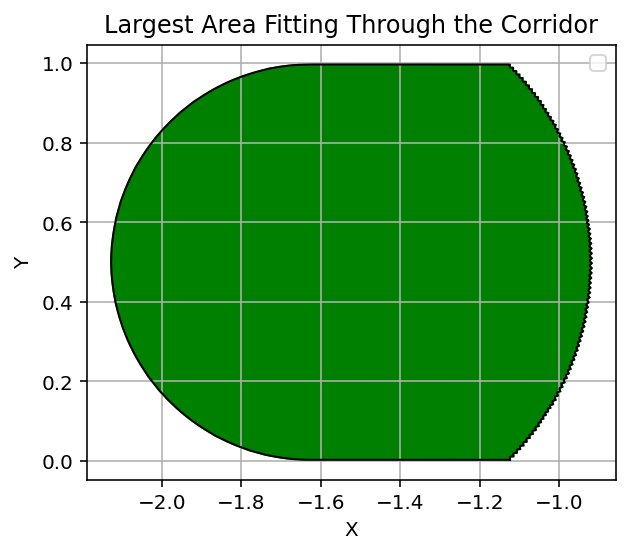

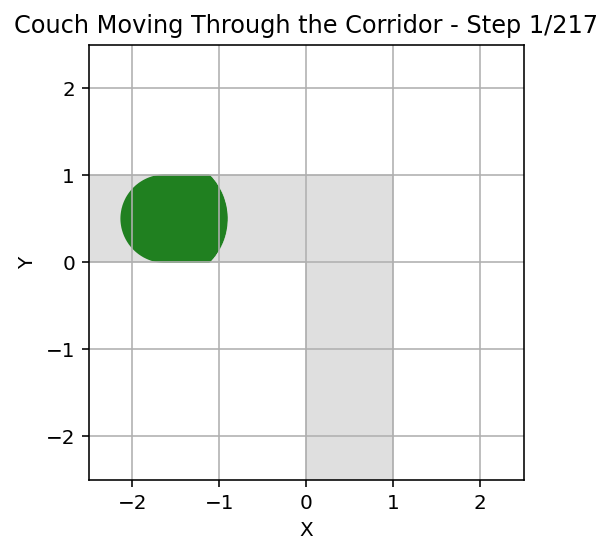

In [ ]:
#@title Turning a sofa around in a corridor with a single 90 degree turn

import numpy as np

class Corridor:

  def __init__(self):
    """Initializes the corridor.

    Args:
        turns: A list of tuples, where each tuple represents a turn:
          (distance_before_turn, turn_angle_degrees) The first segment starts at
          (0, 0) and extends along the x-axis.
    """
    self.width = 1

  def get_corridor_shape(self, angle_degrees, inner_corner_path):
    """Calculates the polygon representing the corridor at a given angle and inner corner position.

    Args:
        angle_degrees: The current rotation angle of the corridor.
        inner_corner_path: A point (x, y) representing the inner corner.

    Returns:
        A shapely Polygon object representing the corridor.
    """
    angle_radians = np.deg2rad(angle_degrees)
    x_inner, y_inner = inner_corner_path

    big_const = 3

    points = [  # simple corner
        (0, 0),
        (0, -big_const * self.width),
        (self.width, -big_const * self.width),
        (self.width, self.width),
        (-big_const * self.width, self.width),
        (-big_const * self.width, 0),
    ]

    corridor_polygon = Polygon(points)

    # Rotate the corridor
    rotated_polygon = transform(
        lambda x, y: (
            x * np.cos(angle_radians) - y * np.sin(angle_radians),
            x * np.sin(angle_radians) + y * np.cos(angle_radians),
        ),
        corridor_polygon,
    )

    # Translate the corridor so its inner corner is at inner_corner_path
    translated_polygon = transform(
        lambda x, y: (x + x_inner, y + y_inner), rotated_polygon
    )

    return translated_polygon


def smooth_path(path, x_tol=0.1, y_tol=0.1, z_tol=1):
  """Smoothens a 3D path by inserting points between segments that exceed

  specified tolerances in any of the x, y, or z coordinates.

  Args:
      path (list of lists or numpy array): A list of 3D points representing the
        path. Each inner list/array should have the format [x, y, z].
      x_tol (float): The maximum allowed difference in the x-coordinate between
        adjacent points.
      y_tol (float): The maximum allowed difference in the y-coordinate between
        adjacent points.
      z_tol (float): The maximum allowed difference in the z-coordinate between
        adjacent points.

  Returns:
      list of lists: A new list of 3D points representing the smoothed path.
  """
  if isinstance(path, list):
    path_np = np.array(path)
  else:  # Assume it's a NumPy array
    path_np = path.copy()
  path = path_np.tolist()  # Convert the NumPy array to a Python list
  path.insert(0, [0, 0, 0])
  path.append([-3.0, 1.0, 180.0])
  # print(f'path (first 10): {path[:10]}')
  # print(f'path: {path[:10]}')

  smoothed_path = [list(path[0])]  # Start with the first point

  for i in range(len(path) - 1):
    p1 = np.array(path[i])
    p2 = np.array(path[i + 1])

    dx = abs(p2[0] - p1[0])
    dy = abs(p2[1] - p1[1])
    dz = abs(p2[2] - p1[2])

    needs_interpolation = dx > x_tol or dy > y_tol or dz > z_tol

    if needs_interpolation:
      # Determine how many intermediate points are needed
      num_x = max(1, int(dx / x_tol) + (1 if dx % x_tol != 0 else 0) - 1)
      num_y = max(1, int(dy / y_tol) + (1 if dy % y_tol != 0 else 0) - 1)
      num_z = max(1, int(dz / z_tol) + (1 if dz % z_tol != 0 else 0) - 1)

      num_interp = max(
          num_x, num_y, num_z
      )  # Take the maximum to satisfy all tolerances

      for j in range(1, num_interp + 1):
        fraction = j / (num_interp + 1)
        interpolated_point = p1 + fraction * (p2 - p1)
        smoothed_path.append(interpolated_point.tolist())

    smoothed_path.append(list(p2))  # Add the next original point

  return np.array(smoothed_path)

my_path = [[-1.5999945169598344, 1.161533061152497e-09, 8.258720806895271e-07], [-1.6874307584573667, -6.180179957050322e-05, 6.999964431160247], [np.float64(-1.3888509002151033), np.float64(-0.0015533939626652172), 55.999714230043935], [np.float64(-1.1728407138608719), np.float64(6.0117155959308585e-05), 84.9996373395063], [-1.1300179834981638, 1.0507793806811838e-06, 89.99952801362582], [np.float64(-1.1212429188593858), np.float64(0.008558818515571234), 90.99917856508051], [np.float64(-1.1127108649272712), np.float64(0.017436493505128648), 91.9922511308626], [np.float64(-1.096036935139796), np.float64(0.03574934156573084), 93.99118465763051], [np.float64(-1.0879768676777868), np.float64(0.04506431219045638), 94.98711087561016], [np.float64(-1.0800652501004706), np.float64(0.05456039584806009), 95.98584649880783], [np.float64(-1.072293813548771), np.float64(0.06421540989106478), 96.98559072966486], [np.float64(-1.0646945761995719), np.float64(0.07395638351194889), 97.9820410575703], [np.float64(-1.049997322384722), np.float64(0.09383598488572252), 99.98023110555492], [np.float64(-1.0208162020963887), np.float64(0.13841172662007864), 104.29847434112173], [np.float64(-1.0145248407575505), np.float64(0.14906066158791761), 105.29825578301427], [np.float64(-1.0084178621309707), np.float64(0.1598346050608881), 106.29803722490679], [np.float64(-1.002525211138219), np.float64(0.17072538227904868), 107.29581183482443], [np.float64(-0.996820553511265), np.float64(0.18167440691616452), 108.29259563296887], [np.float64(-0.9808326424856784), np.float64(0.2152275714852245), 111.29254483935564], [-0.9759388686054532, 0.22660349763029855, 112.2918225849657], [-0.9623715621961836, 0.2612399688129172, 115.29158076074741], [-0.958265104828979, 0.2729431437110135, 116.29157851151567], [-0.9543603758361643, 0.2847186689371755, 117.29157626228393], [np.float64(-0.9438944445691808), np.float64(0.3203987455820104), 120.29107004368807], [np.float64(-0.9408379563630985), np.float64(0.3323987599775938), 121.28957800287007], [np.float64(-0.9379871434439562), np.float64(0.34444993448276323), 122.28819244652851], [np.float64(-0.9353311659783439), np.float64(0.3565718966574936), 123.28758551018831], [np.float64(-0.9253487793215254), np.float64(0.41745553276244823), 128.27056988455033], [np.float64(-0.920793050398977), np.float64(0.478787703205509), 133.236075657692], [np.float64(-0.9206613584220327), np.float64(0.515975871573257), 136.2358634998614], [np.float64(-0.9225246617813437), np.float64(0.5531126426604405), 139.23527040332417], [np.float64(-0.9262484036266335), np.float64(0.589141542019904), 142.15880796008187], [np.float64(-0.931066095473457), np.float64(0.6206970868483389), 144.73884588471236], [np.float64(-0.9333176919303375), np.float64(0.6328727015806302), 145.73822046595126], [np.float64(-0.9357662298788632), np.float64(0.6449685782617903), 146.73477869106298], [np.float64(-0.9384470558602506), np.float64(0.6570530055865759), 147.734644757764], [np.float64(-0.9413324318008222), np.float64(0.6690824047568239), 148.73369037499745], [np.float64(-0.9586037465876642), np.float64(0.7276607820945913), 153.67798928758384], [np.float64(-0.9711631981158645), np.float64(0.7614252251844684), 156.59464560240457], [np.float64(-0.9858603272054737), np.float64(0.7954546910575817), 159.59441277859807], [np.float64(-1.0138108555433736), np.float64(0.8494174159819632), 164.52208814383835], [np.float64(-1.044858709950205), np.float64(0.8986688026749), 169.2479634553807], [np.float64(-1.0519327707290904), np.float64(0.9087403749711507), 170.24466457416165], [np.float64(-1.0592106911236276), np.float64(0.9186912756995325), 171.2440892487544], [np.float64(-1.0666474501479177), np.float64(0.9285014317767207), 172.24192340638155], [np.float64(-1.0742129669069773), np.float64(0.9381355147227604), 173.23483833684162], [np.float64(-1.0979268069284789), np.float64(0.966265882726783), 176.2201998622633], [np.float64(-1.1136214328193845), np.float64(0.9833505238839495), 178.10509961044872], [np.float64(-1.1217659252736578), np.float64(0.991787906448523), 179.05748443653385], [-1.2212052846532582, 1.000000014493536, 179.99999381057197]]
score, int_poly = calculate_intersection_area(Corridor(), my_path)
print(score)
print(len(my_path))
plot_intersection(int_poly, Corridor(), smooth_path(my_path))
animation_object = animate_intersection(int_poly, Corridor(), list(smooth_path(my_path)))
try:
    display(HTML(animation_object.to_jshtml()))
    plt.close() # Close the static plot if running in Jupyter
except ImportError:
    # If not in Jupyter, just show the animation window
    plt.show()

